# Today's seminar outline
🌿 Detailed overview of PixArt-alpha pipeline;<br>
✨ Implementation of an image Generation process;<br>
🕯️ Exploring image generation settings;<br>
🎭 Finetuning Stable Diffusion with DreamBooth;<br>
📜 Evaluating image generation quality with pre-trained models!

This notebook is based on the following sources:
- [01_stable_diffusion_introduction.ipynb](https://github.com/huggingface/diffusion-models-class/blob/main/unit3/01_stable_diffusion_introduction.ipynb), but adapted to PixArt-alpha model;
- [DreamBooth Stable Diffusion](https://colab.research.google.com/github/ShivamShrirao/diffusers/blob/main/examples/dreambooth/DreamBooth_Stable_Diffusion.ipynb) and [DreamBooth fine-tuning with LoRA from PEFT](https://huggingface.co/docs/peft/main/en/task_guides/dreambooth_lora#inference-with-a-single-adapter);
- Original code usage examples for [HPS](https://github.com/tgxs002/HPSv2) and [AQ](https://colab.research.google.com/github/LAION-AI/aesthetic-predictor/blob/main/asthetics_predictor.ipynb) metrics.

### **PixArt-alpha model**

[PixArt-alpha](https://arxiv.org/pdf/2310.00426) is a diffusion-based text-to-image model built on a latent diffusion pipeline with a transformer-based denoiser (Diffusion Transformer, DiT). It uses a T5-XXL text encoder for high-fidelity prompt understanding, a VAE for latent-space compression and reconstruction, and a multi-scale attention mechanism to improve global coherence. The model supports fast inference through optimized sampling schedules and cross-attention conditioning, enabling high-resolution (up to 1024×1024) outputs with strong prompt alignment and efficient compute usage

We will examine its inner parts in more details below

## Step 1: Setup

Install diffusers and necessary dependencies

In [1]:
# %%capture
# !pip install -U diffusers datasets transformers accelerate

import warnings
warnings.filterwarnings('ignore')

In [2]:
import torch
import torchvision.transforms as T
import requests
from PIL import Image
from io import BytesIO
from matplotlib import pyplot as plt
from typing import List

In [3]:
# We'll use a couple of demo images later in the notebook
def download_image(url):
    response = requests.get(url)
    return Image.open(BytesIO(response.content)).convert("RGB")

In [4]:
# Set device
device = (
    "mps" if torch.backends.mps.is_available()
    else "cuda" if torch.cuda.is_available()
    else "cpu"
)

## Step 2. Overview of components

Diffusers provide a high-level user-friendly interface for image generation - so called **pipelines**. At the core of the toolbox are models (UNet denoisers, Autoencoders) and schedulers. Pipelines bundle these components together for convenience

Alternatively, one create and use the models and schedulers separately. Below we provide an on overview of the components and image generation process

For illustration we will use `PixArt-alpha`. Feel free to experiment with other models!

**Create a pipeline**

For the sake of efficiency we load the model in half precision - `fp16`.

Usually, this option doesn't significantly affect image generation quality whereas making the generation process faster and saving memory.

In [5]:
from diffusers import PixArtAlphaPipeline
 
pipeline = PixArtAlphaPipeline.from_pretrained(
    "PixArt-alpha/PixArt-XL-2-1024-MS",
    torch_dtype=torch.float16, # precision
    # variant="fp16", but it is not needed for PixArtAlphaPipeline
).to(device)

2025-11-12 17:31:09.377074: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-12 17:31:09.388193: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-11-12 17:31:09.401252: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-11-12 17:31:09.405176: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-11-12 17:31:09.415965: I tensorflow/core/platform/cpu_feature_guar

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing PixArtTransformer2DModel: 
 ['caption_projection.y_embedding']


In [6]:
print(list(pipeline.components.keys()))  # list of components

# tokenizer: T5Tokenizer                    # prompt tokenizer
# text_encoder: T5EncoderModel              # prompt encoder
# vae: AutoencoderKL                        # autoencoder to work with latent spaces
# transformer: PixArtTransformer2DModel     # denoising transformer model
# scheduler: DPMSolverMultistepScheduler    # diffusion scheduler (and solver)

['tokenizer', 'text_encoder', 'vae', 'transformer', 'scheduler']


As we can see, the **PixArtAlphaPipeline** has the following core components:
* transformer-based denoiser model
* VAE (only decoder part is needed on text-to-image inference)
* text encoder
* text tokenizer
* scheduler

Model config can be observed in more detail in [hugging face files](https://huggingface.co/PixArt-alpha/PixArt-XL-2-1024-MS/tree/main)

Let us cover core components in more detail below

### **VAE**

PixaArt-alpha is *latent* diffusion model: the denoising process happens in the latent space with smaller spatial dimensions and the resulting latent is decoded pack to pixel space

The VAE (variational autoencoder) is a type of model that can encode its input into a compressed representation (which is forced to be close to standart Gaussian distribution) and then decode this 'latent' representation back into something close to the original input. When generating images with latent diffusion models, we first generate the latents by applying the diffusion process in the 'latent space' of the VAE, and then decode them at the end to view the resulting image

<img width="800" src="https://sspark.genspark.ai/cfimages?u1=Q4XTZvzn%2FkTst1wbJREg86Edd92Dim5SBs6vNjbDu%2BOE4YyC70Xi9nwslkCiPKs6L%2Fy09tbl6RvoSCdMY1XKKhBpMVajZctDCDc3zRtjUTz9U10z4QP7&u2=IQkXwRgV2pxDu8x3&width=1024">

Here is some code that takes an input image, encodes it to a latent representation and then decodes it again using the VAE:


In [7]:
image_url = "https://live-production.wcms.abc-cdn.net.au/98a51a3d96c768eb79f760b04efe4bb8?impolicy=wcms_crop_resize&cropH=1560&cropW=1560&xPos=437&yPos=0&width=862&height=862"
image = download_image(image_url)

generated_image = pipeline('Renaissance art').images[0]

  0%|          | 0/20 [00:00<?, ?it/s]

In [8]:
print('original downloaded image size:', image.size)
print('original generated image size:', generated_image.size)

original downloaded image size: (862, 862)
original generated image size: (1024, 1024)


In [9]:
def visualize_images(images: List[Image.Image], figsize=5):
    _, axs = plt.subplots(1, len(images), figsize=(figsize * len(images), figsize))
    
    for i in range(len(images)):
        axs[i].imshow(images[i])

    plt.tight_layout()

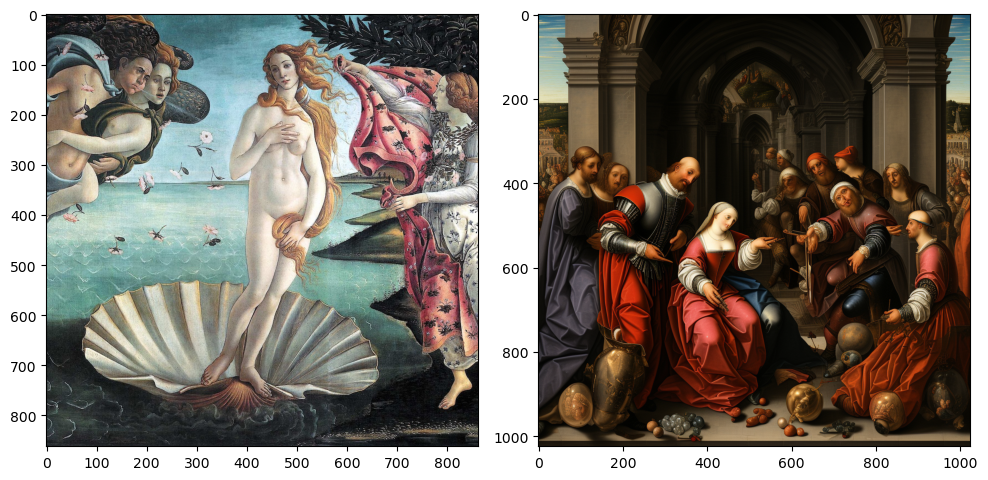

In [10]:
original_images = [image, generated_image]
visualize_images(original_images)

Resize image to 512x512 and convert to tensor

In [11]:
transforms = T.Compose([
    T.Resize(512, interpolation=T.InterpolationMode.LANCZOS),
    T.ToTensor(),
    T.Lambda(lambda x: 2 * x - 1) # map [0, 1] to [-1, 1]
])

to_encode = []
for i in range(len(original_images)):
    to_encode.append(transforms(original_images[i]).to(torch.float16))
    
to_encode = torch.stack(to_encode, dim=0).to(device)

In [12]:
# from  diffusers.models.autoencoders.vae import DiagonalGaussianDistribution

In [13]:
SCALING_FACTOR = pipeline.vae.config.scaling_factor

print(f"original images shape:\t{to_encode.shape}")

# encode to latent space
with torch.no_grad():
  latents = pipeline.vae.encode(to_encode).latent_dist.mean
print(f"encoded latents shape:\t{latents.shape}\n")
print(f"encoded latents mean and var:\t\t{latents.mean().item(), latents.var().item()}")

latents = SCALING_FACTOR * latents
print(f"encoded SCALED latents mean and var:\t{latents.mean().item(), latents.var().item()}\n")

# decode again
with torch.no_grad():
  decoded_images = pipeline.vae.decode(latents / SCALING_FACTOR).sample
print(f"decoded images shape:\t{decoded_images.shape}")

original images shape:	torch.Size([2, 3, 512, 512])
encoded latents shape:	torch.Size([2, 4, 64, 64])

encoded latents mean and var:		(-0.158203125, 19.046875)
encoded SCALED latents mean and var:	(-0.0288238525390625, 0.6318359375)

decoded images shape:	torch.Size([2, 3, 512, 512])


In [14]:
to_encode = to_encode.cpu()
latents = latents.cpu()
decoded_images = decoded_images.cpu()

Let us visualize the decoded image

In [15]:
def relative_l2(original, decoded):
    diff = torch.clamp(decoded, -1, 1) - original
    return (torch.norm(diff, p=2) / torch.norm(original, p=2)).item()

print('downloaded image L2:', relative_l2(to_encode[0], decoded_images[0]), sep='\t')
print('generated image L2:', relative_l2(to_encode[1], decoded_images[1]), sep='\t')

downloaded image L2:	0.303955078125
generated image L2:	0.1396484375


In [16]:
transforms = T.Compose([
    T.Lambda(lambda x: 0.5 * (x.clamp(-1, 1) + 1)),
    T.ToPILImage(),
])

decoded_images = list(decoded_images.unbind(dim=0))
for i in range(len(decoded_images)):
    decoded_images[i] = transforms(decoded_images[i])

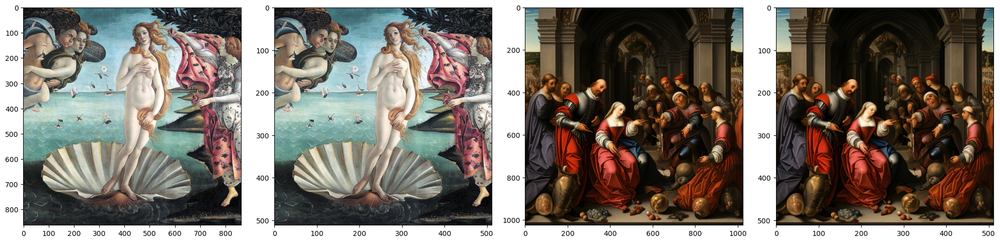

In [17]:
visualize_images([original_images[0], decoded_images[0], original_images[1], decoded_images[1]])

Let us visualize latents

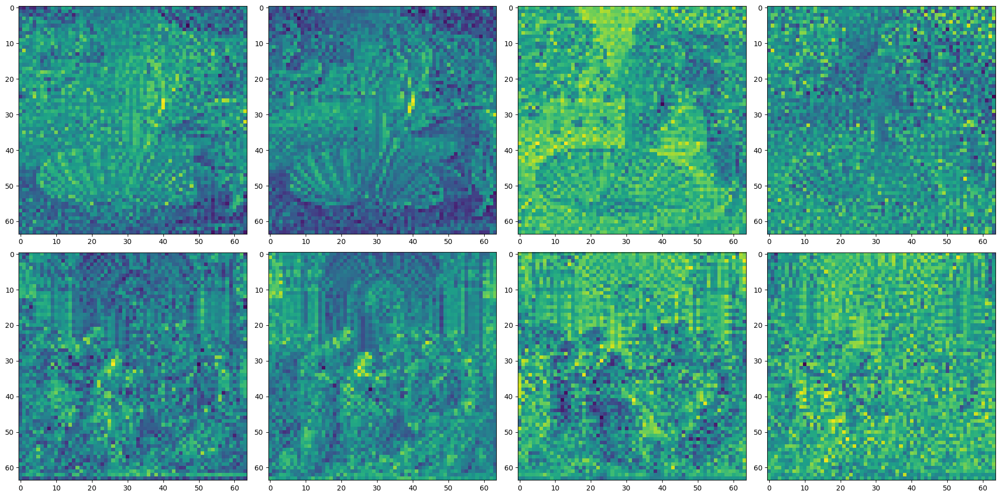

In [18]:
batch_size, latent_dims, _, _ = latents.shape
vis_scale = 5

fig, ax = plt.subplots(
    batch_size, latent_dims, 
    figsize=(vis_scale * latent_dims, vis_scale * batch_size)
)

for i in range(batch_size):
    for j in range(latent_dims):
      ax[i, j].imshow(latents[i, j])
  
plt.tight_layout()

Note that latents resemble original image

### **Text encoder and tokenizer**

<img width=700 src="https://substackcdn.com/image/fetch/$s_!7oKb!,f_auto,q_auto:good,fl_progressive:steep/https%3A%2F%2Fsubstack-post-media.s3.amazonaws.com%2Fpublic%2Fimages%2F7087036a-5b06-4ea3-b2f2-83b6417b8f61_1536x537.png">

Text encoder turns an input string (the prompt) into a numerical representation that can be fed to the **UNet** as conditioning. The text is first turned into a series of tokens using the pipeline's tokenizer. The text encoder has a vocabulary of about *50k* tokens - any word isn't in this vocabulary is split into smaller sub-words. The tokens are then fed through the text encoder model itself - a transformer model that was originally trained as the text encoder for **CLIP**. The hope is that this pretrained transformer model has learnt rich representations of text that will be useful for the diffusion task too.

Let's test out this process by encoding an example prompt, first manually tokenizing and feeding it through the text encoder and then using the pipelines `encode_prompt` method to show the full process including padding/truncating the length to the maximum length of **120** tokens:


In [19]:
# max_sequence_length (`int`, defaults to 120): Maximum sequence length to use for the prompt

Let's tokenize and encode an example prompt manually to observe it in more details

In [20]:
# from transformers import T5Tokenizer, T5EncoderModel

In [21]:
# tokenizing and encoding an example prompt manually
print('tokinizer vocab size:', pipeline.tokenizer.vocab_size, '\n')

# tokenize
input_ids = pipeline.tokenizer(["Renaissance art and smth else in a prompt"])['input_ids']

# print output tokens ids and corresponding tokens
for input_id in input_ids[0]:
  print(f"[{input_id}] {pipeline.tokenizer.decode(input_id)}")

tokinizer vocab size: 32000 

[21616] Renaissance
[768] art
[11] and
[3] 
[7] s
[51] m
[189] th
[1307] else
[16] in
[3] 
[9] a
[9005] prompt
[1] </s>


In [22]:
# get text embeddings
input_ids = torch.tensor(input_ids).to(device)

with torch.no_grad():
  text_embeddings = pipeline.text_encoder(input_ids)['last_hidden_state']

print(f"\ntext embeddings shape: {text_embeddings.shape}")


text embeddings shape: torch.Size([1, 13, 4096])


These text embeddings (the so-called `hidden states` of the last transformer block in the text encoder model) will be fed to the denoising transformer as an additional argument to the `forward` method, which we'll see below

### **The Scheduler**

The scheduler stores the **noise schedule** 

<img width=700 src="https://github.com/thecrazymage/DL2_HSE/blob/main/week_09/images/noise_schedule.png?raw=true">

It also manages updating the noisy sample based on the model predictions

The default scheduler is a [`DPMSolverMultistepScheduler`](https://huggingface.co/docs/diffusers/en/api/schedulers/multistep_dpm_solver), but you can also use others (such as [`UniPCMultistepScheduler`](https://huggingface.co/docs/diffusers/en/api/schedulers/unipc)) as long as they are initialized with the same configuration

In [23]:
# from diffusers import UniPCMultistepScheduler

# pipeline.scheduler = UniPCMultistepScheduler.from_config(pipeline.scheduler.config)

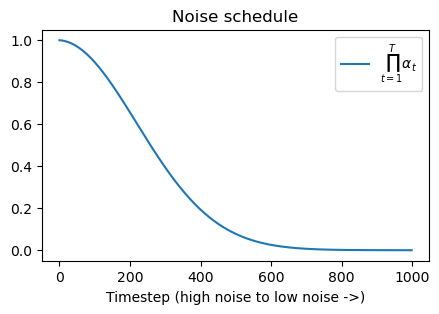

In [24]:
fig, ax = plt.subplots(figsize=(5, 3))

ax.plot(pipeline.scheduler.alphas_cumprod, label=r'$\prod_{t=1}^{T} \alpha_t$')
ax.set_xlabel('Timestep (high noise to low noise ->)')
ax.set_title('Noise schedule')
ax.legend();

### **PixArt's transformer denoising model**

The PixArt's **DiT** takes a noisy input $x_t$ and predicts the noise. It also employs **timestep conditioning** and  takes in the **text embeddings** of the prompt as an additional input

<img style="float: center; margin-left: 30px" width=300 src="https://huggingface.co/PixArt-alpha/PixArt-XL-2-1024-MS/resolve/main/asset/images/model.png">

<img style="float: center; margin-left: 30px" width=375 src="https://github.com/thecrazymage/DL2_HSE/blob/main/week_09/images/transformer_block.png?raw=true">


Let us show a single forward step below

In [25]:
# DENOISING TRANSFORMER

# def forward(
#         self,
#         hidden_states: torch.Tensor,
#         encoder_hidden_states: Optional[torch.Tensor] = None,
#         timestep: Optional[torch.LongTensor] = None,
#         added_cond_kwargs: Dict[str, torch.Tensor] = None,
#         cross_attention_kwargs: Dict[str, Any] = None,
#         attention_mask: Optional[torch.Tensor] = None,
#         encoder_attention_mask: Optional[torch.Tensor] = None,
#         return_dict: bool = True,
#     ):

In [26]:
# prepare
batch_size = 1
height, width = 1024, 1024

resolution = torch.tensor([height, width], device=device).repeat(batch_size, 1)
aspect_ratio = torch.tensor([float(height / width)], device=device).repeat(batch_size, 1)

added_cond_kwargs = {"resolution": resolution, "aspect_ratio": aspect_ratio}

In [27]:
# dummy inputs
pipeline.scheduler.set_timesteps(num_inference_steps=50)
timestep = pipeline.scheduler.timesteps[0].unsqueeze(0).to(device)

latents = torch.randn(batch_size, 4, 128, 128, device=device, dtype=torch.float16)
text_embeddings = torch.randn(batch_size, 120, 4096, device=device, dtype=torch.float16)

In [28]:
# model prediction
with torch.no_grad():
  output = pipeline.transformer(
      hidden_states=latents, 
      encoder_hidden_states=text_embeddings,
      timestep=timestep,
      added_cond_kwargs=added_cond_kwargs
    ).sample

print(f"DiT output shape: {output.shape}") # NOT same shape as the input latents......... why?? ((

DiT output shape: torch.Size([1, 8, 128, 128])


In [29]:
# TRANFORMER FORWARD
# output = hidden_states.reshape(
#     shape=(-1, self.out_channels, height * self.config.patch_size, width * self.config.patch_size)
# )
# self.out_channels: config.out_channels == 8

# PIPELINE FORWARD
# learned sigma
# if self.transformer.config.out_channels // 2 == latent_channels:
#     noise_pred = noise_pred.chunk(2, dim=1)[0]
# else:
#     noise_pred = noise_pred

DiT involves transformer blocks and adaptive instance normalization block for timestep projection

In [30]:
pipeline.transformer.adaln_single

AdaLayerNormSingle(
  (emb): PixArtAlphaCombinedTimestepSizeEmbeddings(
    (time_proj): Timesteps()
    (timestep_embedder): TimestepEmbedding(
      (linear_1): Linear(in_features=256, out_features=1152, bias=True)
      (act): SiLU()
      (linear_2): Linear(in_features=1152, out_features=1152, bias=True)
    )
    (additional_condition_proj): Timesteps()
    (resolution_embedder): TimestepEmbedding(
      (linear_1): Linear(in_features=256, out_features=384, bias=True)
      (act): SiLU()
      (linear_2): Linear(in_features=384, out_features=384, bias=True)
    )
    (aspect_ratio_embedder): TimestepEmbedding(
      (linear_1): Linear(in_features=256, out_features=384, bias=True)
      (act): SiLU()
      (linear_2): Linear(in_features=384, out_features=384, bias=True)
    )
  )
  (silu): SiLU()
  (linear): Linear(in_features=1152, out_features=6912, bias=True)
)

## Step 3. Overview of an image generation process

<img style="float: left; margin-left: 10px; margin-right: 50px;" width=400 src="https://raw.githubusercontent.com/patrickvonplaten/scientific_images/master/stable_diffusion.png">

Image generation process for text-to-image latent diffusion models (starting from Stable Diffusion model) is the same iterative denoising procedure you we seen before

However, there are several **crucial differences**:
* Diffusion process takes place in the latent space;
* Text conditioning is passed as an input to the model;
* For better generation quality and image fidelity one uses classifier free guidance.
<br><br><br>

Therefore, the sampling procedure looks as follows:
1. Initialize random noise;
2. Run sampling loop with conditional and unconditional prediction: $$\varepsilon_t^{CFG} = (1 + \gamma) \varepsilon_t(z_t, c) - \gamma \varepsilon_t(z_t, \emptyset);$$
3. Decode the resulting latent into pixel space.

The whole pipeline is illustrated in the image



In [31]:
guidance_scale = 7.5
num_inference_steps = 25
prompt = "an Italian Renaissance painting with a biblical theme"

# set up a generator for reproducibility
seed = 42
generator = torch.Generator(device=device).manual_seed(seed)

In [32]:
# 1. encode the prompt
(
    prompt_embeds,
    prompt_attention_mask,
    negative_prompt_embeds,
    negative_prompt_attention_mask,
) = pipeline.encode_prompt(
    prompt,
    do_classifier_free_guidance=True,
    device=device,
    num_images_per_prompt=1,
    max_sequence_length=120,
)

prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds], dim=0)
prompt_attention_mask = torch.cat([negative_prompt_attention_mask, prompt_attention_mask], dim=0)

In [33]:
# 2. generate random noise and scale as required be the scheduler
latents = torch.randn((1, 4, 128, 128), device=device, dtype=torch.float16, generator=generator)
latents *= pipeline.scheduler.init_noise_sigma


# 3. prepare the scheduler
pipeline.scheduler.set_timesteps(num_inference_steps, device=device)


# 4. prepare the added kwargs
resolution = torch.tensor([height, width], device=device).repeat(batch_size, 1)
aspect_ratio = torch.tensor([float(height / width)], device=device).repeat(batch_size, 1)

resolution = torch.cat([resolution, resolution], dim=0)
aspect_ratio = torch.cat([aspect_ratio, aspect_ratio], dim=0)

added_cond_kwargs = {"resolution": resolution, "aspect_ratio": aspect_ratio}

In [34]:
from tqdm.notebook import tqdm

# 5. loop through the sampling timesteps
for i, t in tqdm(enumerate(pipeline.scheduler.timesteps)):
  # 5.1 expand the latents for classifier free guidance
  latent_model_input = torch.cat([latents] * 2)
  # 5.2 apply any scaling required by the scheduler
  latent_model_input = pipeline.scheduler.scale_model_input(latent_model_input, t)
  
  current_timestep = t[None].expand(latent_model_input.shape[0])
  
  # 5.3 predict the noise residual with the DiT model
  with torch.no_grad():
    noise_pred = pipeline.transformer(
        latent_model_input,
        encoder_hidden_states=prompt_embeds,
        encoder_attention_mask=prompt_attention_mask,
        timestep=current_timestep,
        added_cond_kwargs=added_cond_kwargs,
        return_dict=False
    )[0]

  # 5.4 perform guidance
  noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
  noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
  
  # 5.5 remove the predicted sigma 
  noise_pred = noise_pred.chunk(2, dim=1)[0]
  
  # 5.6 compute the previous noisy sample x_t -> x_t-1
  latents = pipeline.scheduler.step(noise_pred, t, latents, return_dict=False)[0]


0it [00:00, ?it/s]

In [35]:
latents.shape

torch.Size([1, 4, 128, 128])

In [36]:
# 5. decode the resulting latents into an image
with torch.no_grad():
  image = pipeline.vae.decode(latents / pipeline.vae.config.scaling_factor, return_dict=False)[0]
  
print(type(image))

<class 'torch.Tensor'>


Let us visualize the generated image

In [37]:
image = pipeline.image_processor.postprocess(image, output_type='pil')


# image = self.pt_to_numpy(image)

# if output_type == "np":
#     return image

# if output_type == "pil":
#     return self.numpy_to_pil(image)

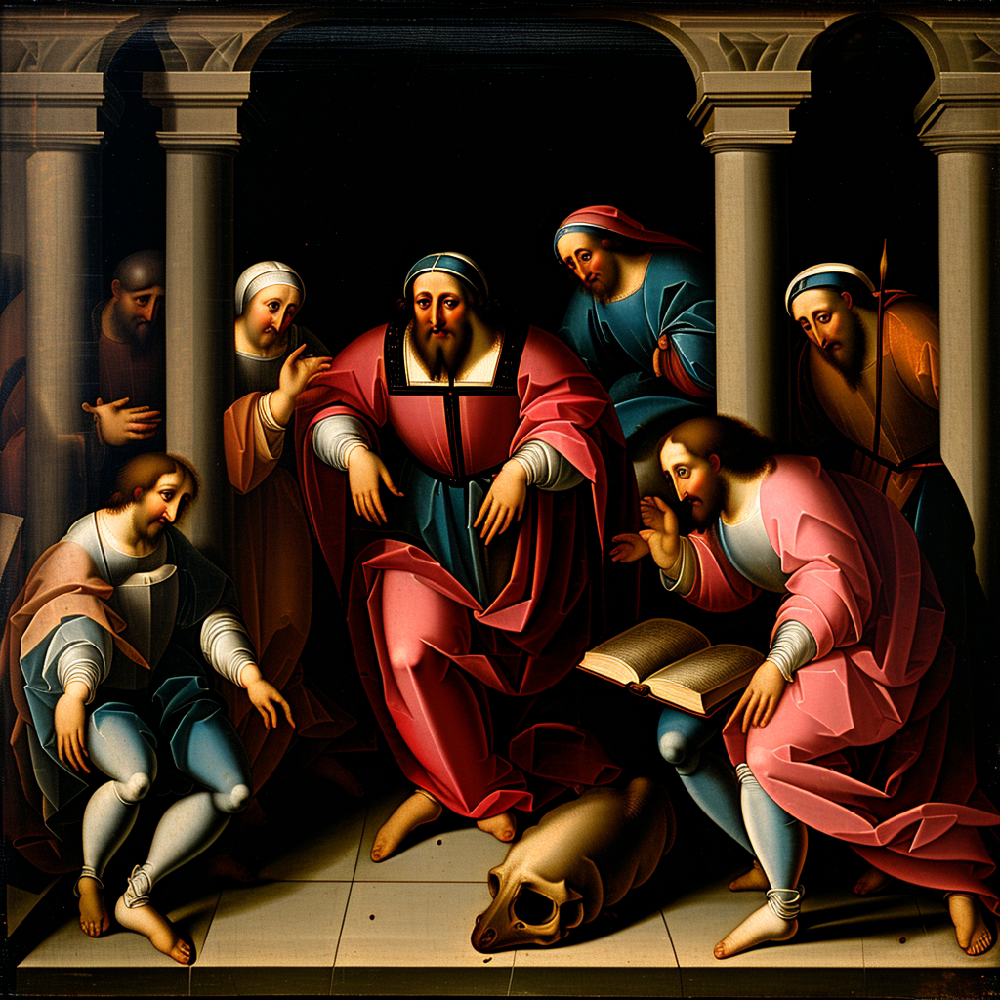

In [38]:
image[0]

Diffusers provide a simple-to-use pipelines where are steps shown above are implemented under the hood

In [39]:
image = pipeline(
    prompt, 
    generator=generator, 
    num_inference_steps=num_inference_steps, 
    guidance_scale=guidance_scale
).images[0]

  0%|          | 0/25 [00:00<?, ?it/s]

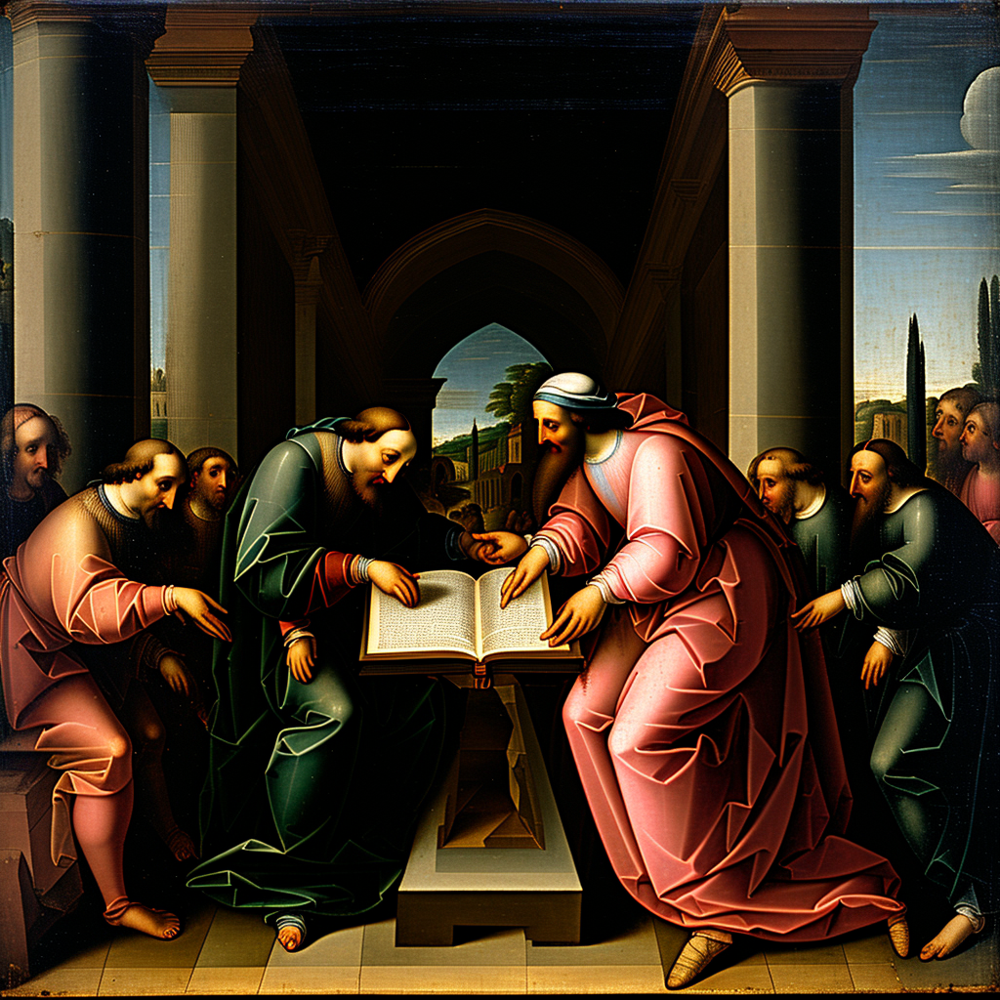

In [40]:
image

## Step 4. Exploring image generation settings

There are several typical parameters that have a dramatic effect on the quality of resulting generations: `num_inference_steps` and `guidance_scale` <br><br>

In general, image generation quality improves with more **sampling steps**. However, increase of steps leads to longer generation steps. Usually number of steps is determined based on trade-off between image quality and runtime. 20-50 steps (depending on solver) are typical choice

A **solver order** (the number of previous predictions to use as an information to predict the next step) is also an impactfull parameter in terms of generation quality

Higher value of **CFG scale** improves text-image alignment and image fidelity. However, this comes at the price of the decrease and diversity and the images tend to be oversaturrated for too large value of `guidance_scale`
<br><br>

Let us explore those parameters below:

In [41]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))
    # grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [42]:
from IPython.display import clear_output

guidance_scale_options = [0, 1, 2, 4, 8, 16, 32]
num_inference_steps_options = [2, 4, 16, 32]

prompt = "an impressionist-style nature painting"

generator = torch.Generator(device="cuda")

images = []
for num_inference_steps in num_inference_steps_options:
  for guidance_scale in guidance_scale_options:
    # fix seed
    generator.manual_seed(42)
    image = pipeline(
        prompt,
        generator=generator,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale
    ).images[0]
    images.append(image)
    
clear_output()

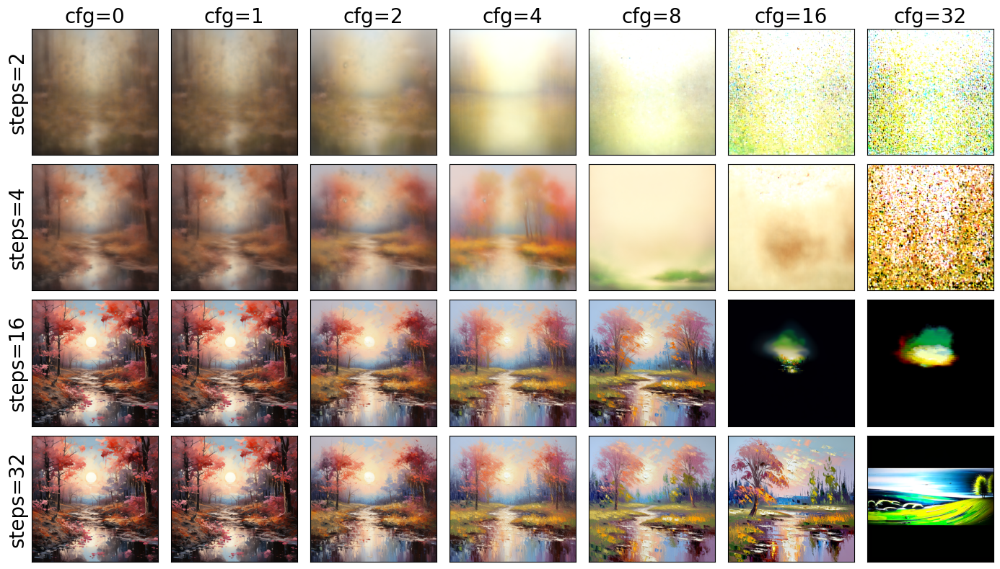

In [43]:
nrows = len(num_inference_steps_options)
ncols = len(guidance_scale_options)
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 2, nrows * 2))

for i in range(nrows):
  for j in range(ncols):
    ax[i, j].imshow(images[i * ncols + j])
    ax[i, j].set_xticks([])
    ax[i, j].set_yticks([])
    if i == 0:
      ax[0, j].set_title(f"cfg={guidance_scale_options[j]}", fontsize=20)
    if j == 0:
      ax[i, 0].set_ylabel(f"steps={num_inference_steps_options[i]}", fontsize=20)

fig.tight_layout()

**Observations**

* For small number of inference steps Stable Diffusion yields random noise for any `guidance_scale`;
* For low `guidance_scale` images do not follow the prompt conditioning enough;
* For high `guidance_scale` images are oversaturated.

Impact on diversity

In [44]:
num_inference_steps = 32
seeds = [3, 42, 66, 77, 777]

low_cfg_images = []
for seed in seeds:
    # fix seed
    generator.manual_seed(seed)
    image = pipeline(
        prompt,
        generator=generator,
        num_inference_steps=num_inference_steps,
        guidance_scale=2
    ).images[0]
    low_cfg_images.append(image)

high_cfg_images = []
for seed in seeds:
    # fix seed
    generator.manual_seed(seed)
    image = pipeline(
        prompt,
        generator=generator,
        num_inference_steps=num_inference_steps,
        guidance_scale=8
    ).images[0]
    high_cfg_images.append(image)
    
clear_output()

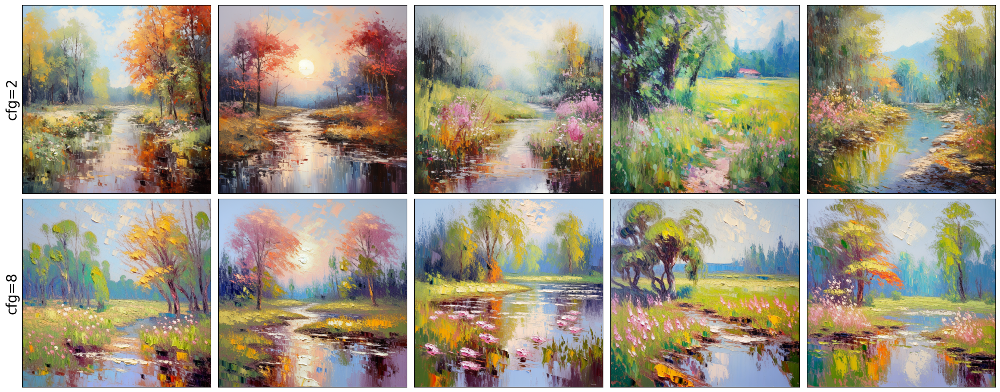

In [45]:
ncols = len(seeds)
fig, ax = plt.subplots(nrows=2, ncols=ncols, figsize=(ncols * 4, 2 * 4))

for j in range(ncols):
    ax[0, j].imshow(low_cfg_images[j])
    ax[0, j].set_xticks([])
    ax[0, j].set_yticks([])
    ax[1, j].imshow(high_cfg_images[j])
    ax[1, j].set_xticks([])
    ax[1, j].set_yticks([])
    if j == 0:
      ax[0, j].set_ylabel("cfg=2", fontsize=20)
      ax[1, j].set_ylabel("cfg=8", fontsize=20)

fig.tight_layout()

In [46]:
guidance_scale = 4
num_inference_steps = 10
solver_orders_options = [1, 2, 3]

prompt = 'candles in a dimmed light, reanissance style painting'

images = []
for solver_order in solver_orders_options:
    pipeline.scheduler.solver_order = solver_order
    pipeline.scheduler.config.solver_order = solver_order
    
    # fix seed
    generator.manual_seed(42)
    image = pipeline(
        prompt,
        generator=generator,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale
    ).images[0]
    
    images.append(image)
    
clear_output()

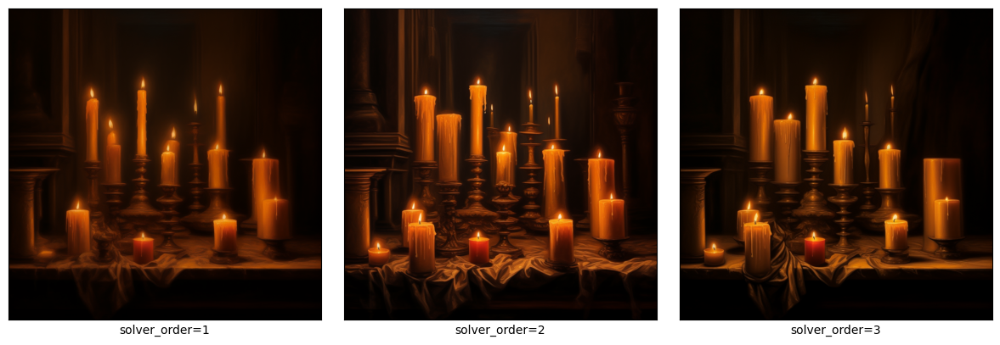

In [47]:
ncols = len(solver_orders_options)
fig, ax = plt.subplots(nrows=1, ncols=ncols, figsize=(ncols * 4, 4))

for j in range(ncols):
    ax[j].imshow(images[j])
    ax[j].set_xlabel(f"solver_order={solver_orders_options[j]}", fontsize=10)
    
    ax[j].set_xticks([])
    ax[j].set_yticks([])

fig.tight_layout()

In [48]:
# https://huggingface.co/docs/diffusers/en/api/schedulers/multistep_dpm_solver
# Tips: It is recommended to set solver_order to 2 for guide sampling, and solver_order=3 for unconditional sampling.

In [49]:
pipeline.scheduler.solver_order = 2
pipeline.scheduler.config.solver_order = solver_order

## Step 5. Finetuning Diffusion model

Imagine, you would like to generate an image with you, your friend, your pet, your favourite toy, whatever

Whereas any pre-trained diffusion model is pretty good at generating general concepts and celebrities it is unlikely to have seen some specific and narrow concepts in the training data. Therefore, we need to teach the model somehow about it

### What is DreamBooth?

![](https://dreambooth.github.io/DreamBooth_files/teaser_static.jpg)

DreamBooth is a technique to teach new concepts to pretrained diffusion model using a specialized form of fine-tuning

The way DreamBooth works is as follows:

* Collect input images (more is better) of a subject (e.g., your dog) and define a unique identifier [V] that refers to the subject. This identifier is a some made up word or a rarely used token which is implanted in different text prompts at inference time to place the subject in different contexts;
* Fine-tune the diffusion model by providing the images together with a text prompt like "A photo of a [V] dog" that contains the unique identifier and class name (i.e., "dog" in this example);
* (Optionally) Apply a special _class-specific prior preservation loss_, which leverages the semantic prior that the model has on the class and encourages it to generate diverse instances belong to the subject's class by injecting the class name in the text prompt

An overview of the DreamBooth technique is shown in the image below:

![](https://dreambooth.github.io/DreamBooth_files/high_level.png)

When tuning Diffusion model we would like to meet following two requirements:
* Learn new concept;
* Preserve prior knowledge
<br><br><img style="float: right; margin-left: 30px; margin-right: 100px;" width=300 src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRtA1GBq4aUlgQA61LdWNi5zmwSK-HL44lSYg&s">

Therefore, a natural way to-go is to finetune a **small** fraction of parameters: [Low-Rank Adapters](https://arxiv.org/abs/2106.09685) are a common choice

The idea is quite simple:
1. Choose a subset of linear/convolutional layers to be modified
2. Train Low-Rank addition to the weights of chosen layers:
$$
\mathbf{W} = \mathbf{W} + \frac{\alpha}{r} A B
$$

If rank $r$ of the adapter is much smaller than the dimensions of the matrices $d$, number of trainable parameters is much smaller than the total amount of weights of the model, leading to significant reduction in memory consumption (on parameter gradients and optimizer states) for large models.


Below we will adopt `train_dreambooth.py` from [PEFT](https://huggingface.co/docs/peft/index) library

### Setup

First we need to install 🤗 PEFT.

In [50]:
# !git clone https://github.com/huggingface/peft
# %cd peft/examples/lora_dreambooth

# !pip install -r requirements.txt
# !pip install git+https://github.com/huggingface/peft

**Prepare images**

Below we will download images of one pokemon popular in Belarus. You may experiment with any other concept you like.

In [51]:
# !curl https://www.orthrusonline.ru/static/images/p/nextgen/bulbasaur.png -o images/bulbasaur1.png
# !curl https://static.wikia.nocookie.net/pokemon/images/5/57/0001Bulbasaur_AG_anime_2.png/revision/latest/scale-to-width-down/250?cb=20150101074702 -o images/bulbasaur2.png
# !curl https://w7.pngwing.com/pngs/856/172/png-transparent-bulbasaur-pokemon-adventures-pikachu-charmander-bulbasaur-mammal-leaf-carnivoran.png -o images/bulbasaur3.png
# !curl https://pm1.aminoapps.com/6685/15315dfa800a1b5433590e67a3bca901e93ab923_00.jpg -o images/bulbasaur4.jpg
# !curl https://w7.pngwing.com/pngs/840/277/png-transparent-bulbasaur-thumbnail.png -o images/bulbasaur5.jpg

Let us visualize images

In [52]:
# images = []
# for image_path in os.listdir("images"):
#   images.append(Image.open(os.path.join("images", image_path)))

# ncols = len(images)
# fig, ax = plt.subplots(ncols=ncols, figsize=(ncols * 2, 2))

# for j in range(ncols):
#     ax[j].imshow(images[j])
#     ax[j].set_xticks([])
#     ax[j].set_yticks([])

# fig.tight_layout()

Code below takes a while (10-15 minutes on Colab).

Dreambooth finetuning is an essence a usual diffusion model training for relatively short number of iterations (100-1000).

In [53]:
# %%bash
# cd peft/examples/lora_dreambooth

# MODEL_NAME="CompVis/stable-diffusion-v1-4"
# INSTANCE_DIR=images
# OUTPUT_DIR="stable-diffusion-v1-4-bulbasaur"

# accelerate launch train_dreambooth.py \
#   --pretrained_model_name_or_path=$MODEL_NAME  \
#   --instance_data_dir=$INSTANCE_DIR \
#   --output_dir=$OUTPUT_DIR \
#   --train_text_encoder \
#   --num_dataloader_workers=1 \
#   --instance_prompt="a photo of bulbasaur" \
#   --class_prompt="a photo of an animal" \
#   --resolution=512 \
#   --train_batch_size=1 \
#   --lr_scheduler="constant" \
#   --lr_warmup_steps=0 \
#   --num_class_images=200 \
#   --use_lora \
#   --lora_r 16 \
#   --lora_alpha 27 \
#   --lora_text_encoder_r 16 \
#   --lora_text_encoder_alpha 17 \
#   --learning_rate=1e-4 \
#   --gradient_accumulation_steps=1 \
#   --gradient_checkpointing \
#   --max_train_steps=400

# Metrics

### **Aesthetic quality metric**

A linear estimator on top of clip to predict the aesthetic quality of pictures. The code below is adapted from [original colab notebook](https://colab.research.google.com/github/LAION-AI/aesthetic-predictor/blob/main/asthetics_predictor.ipynb)

<img src="https://miro.medium.com/v2/resize:fit:1400/1*h5xJzfFAfjdysNvqQbB9nQ.png">

In [54]:
prompts = [
    "Ultra-detailed portrait of a woman standing in soft north-facing studio light, freckles and subtle peach-fuzz visible, shallow depth of field, medium-format photography look, natural skin texture, gentle expression, warm color palette, no makeup, crisp focus on the eyes, background fading into creamy bokeh.",

    "Cinematic wide-angle shot of a neon-lit rainy street in Tokyo at night, reflections glowing on wet pavement, pedestrians carrying transparent umbrellas, lens flare, volumetric light beams, motion blur from passing bicycles, high contrast, Kodak Vision3 500T color grading.",

    "Oil painting in the style of John Singer Sargent: a woman in a white dress seated near a window, soft daylight illuminating her face, expressive broad brushstrokes, subtle impasto, rich but muted color palette, strong sense of form and atmosphere, soft edge transitions.",

    "Extreme macro photograph of morning dew on a dragonfly’s wings, each droplet reflecting tiny inverted landscapes, iridescent wing membranes, razor-sharp microdetail, natural sunlight with soft highlights, neutral background blur.",

    "Surreal dreamscape of a floating marble staircase twisting into a lavender sky, translucent whales swimming through clouds, soft directional light, pastel color palette, matte painterly aesthetic, subtle grain, perfectly balanced composition."
]

images = pipeline(prompts, num_inference_steps=20, guidance_scale=4).images

  0%|          | 0/20 [00:00<?, ?it/s]

In [55]:
import torch
import open_clip
from urllib.request import urlretrieve

class AQMetric:
    """
        Aesthetic Quality Metric
        Adapted from https://github.com/LAION-AI/aesthetic-predictor
    """
    
    def __init__(
        self,
        model_name_or_path='pretrained/sa_0_4_vit_l_14_linear.pth',
        clip_model_name='ViT-L/14',
        device='cuda:0'
    ):
        self.device = device
        
        self.clip_model, _, self.preproccesor = open_clip.create_model_and_transforms(clip_model_name, pretrained='openai')
        
        self.clip_model.eval()
        self.clip_model.to(device)
        
        for param in self.clip_model.parameters():
            param.requires_grad = False
        
        self.model = torch.nn.Linear(768, 1).to(device)
        self.model.load_state_dict(torch.load(model_name_or_path, map_location=device))
        self.model.eval()
        
        for param in self.model.parameters():
            param.requires_grad = False
    
    
    @torch.inference_mode()
    def __call__(self, images):
        values = []
        for image in images:
            image = self.preproccesor(image).unsqueeze(dim=0).to(device)

            images_features = self.clip_model.encode_image(image)
            images_features /= images_features.norm(dim=-1, keepdim=True)
            
            values.append(self.model(images_features))
            
        return values

ulr = "https://github.com/LAION-AI/aesthetic-predictor/blob/main/sa_0_4_vit_l_14_linear.pth?raw=true"
urlretrieve(ulr, 'pretrained/sa_0_4_vit_l_14_linear.pth')

('pretrained/sa_0_4_vit_l_14_linear.pth',
 <http.client.HTTPMessage at 0x7fd254f75a00>)

In [56]:
aq = AQMetric(device=device)
aq_values = aq(images)

'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: b401c348-27de-4b51-8fef-30f03d00bd08)')' thrown while requesting HEAD https://huggingface.co/timm/vit_large_patch14_clip_224.openai/resolve/main/open_clip_model.safetensors
Retrying in 1s [Retry 1/5].


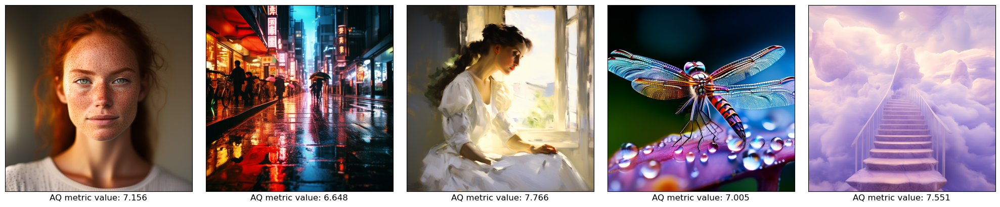

In [57]:
ncols = len(images)
fig, ax = plt.subplots(nrows=1, ncols=ncols, figsize=(ncols * 4, 4))

for j in range(ncols):
    ax[j].imshow(images[j])
    ax[j].set_xlabel(
        f"AQ metric value: {round(aq_values[j].item(), 3)}", 
        fontsize=12
    )
    
    ax[j].set_xticks([])
    ax[j].set_yticks([])

fig.tight_layout()

### **Human Preference Score**

[Human Preference Score v2 (HPS v2)](https://github.com/tgxs002/HPSv2) is a preference prediction model trained on HPD v2. HPS v2 can be used to compare images generated with the **same prompt**

<img src="https://github.com/tgxs002/HPSv2/blob/master/hpsv2/assets/overview.png?raw=true">

In [58]:
prompt = "Renaissance-style oil painting of a scholar writing by candlelight in a dim study, warm golden glow illuminating his face, rich chiaroscuro shadows, detailed wooden desk with scattered parchment, soft smoke rising from melted candles, textured brushstrokes, deep earth-toned palette, serene and contemplative atmosphere."

images = pipeline(prompt, num_inference_steps=20, guidance_scale=4, num_images_per_prompt=5).images

  0%|          | 0/20 [00:00<?, ?it/s]

In [59]:
from huggingface_hub import hf_hub_download
from hpsv2.src.open_clip import get_tokenizer
from hpsv2.img_score import initialize_model, model_dict
from hpsv2.utils import hps_version_map

class HPSMetric:
    """
        HPSv2 (Human Preference Score v2)
        Adapted from https://github.com/tgxs002/HPSv2
    """

    def __init__(
        self, 
        hps_version='v2.1', 
        device='cuda:0'
    ):
        self.device = device
        self.hps_version = hps_version
        initialize_model()
        self.model = model_dict["model"].to(device).eval()
        for param in self.model.parameters():
            param.requires_grad = False
        
        ckpt = hf_hub_download("xswu/HPSv2", hps_version_map[hps_version])
        self.model.load_state_dict(torch.load(ckpt, map_location=device)["state_dict"])
        self.preprocess = model_dict["preprocess_val"]
        self.tokenizer  = get_tokenizer("ViT-H-14")


    @torch.inference_mode()
    def __call__(self, images, prompts):
        
        images = torch.stack([
            self.preprocess(img) for img in images
        ]).to(self.device)
        
        prompts = self.tokenizer(prompts).to(self.device)
        
        feats = self.model(images, prompts)
        scores = (feats["image_features"] @ feats["text_features"].T).diagonal()
        
        return scores

In [60]:
hps = HPSMetric(device=device)

prompts = [prompt] * 5
hps_values = hps(images, prompts)

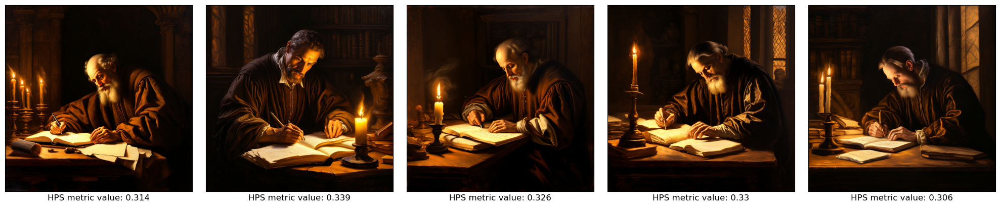

In [61]:
ncols = len(images)
fig, ax = plt.subplots(nrows=1, ncols=ncols, figsize=(ncols * 4, 4))

for j in range(ncols):
    ax[j].imshow(images[j])
    ax[j].set_xlabel(
        f"HPS metric value: {round(hps_values[j].item(), 3)}", 
        fontsize=12
    )
    
    ax[j].set_xticks([])
    ax[j].set_yticks([])

fig.tight_layout()